# Data Preprocessing

Before you train YOLOv5 on the MOT17 dataset, you must preprocess the data to match the required YOLO format

First, you need to mount the google drive to your colab notebook and then preprocess the MOT17 data

In [1]:
#from google.colab import drive
#drive.mount('/content/drive')
#source_path = '/content/drive/MyDrive/MOT17/train'
import os
import cv2
import torch
import shutil
import random
import numpy as np
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt

np.random.seed(42)

### Converting annotations:

MOT17 uses a different annotation format (CSV-style with bounding boxes in top-left format). We need to convert these into YOLO format (normalized center-based coordinates).

In [2]:
def convert_bbox_to_yolo(x1, y1, w, h, img_w, img_h):
    x_center = (x1 + w / 2) / img_w
    y_center = (y1 + h / 2) / img_h
    w_norm = w / img_w
    h_norm = h / img_h
    return [x_center, y_center, w_norm, h_norm]

### Organizing the dataset:

Create a new folder in google drive and inside it create train, val and test folders to store the processed data

Train folder contains : train/images , train/labels subfolders

Val folder contains : val/images , val/labels subfolders

Test folder contains: test/images

In [6]:
#output_path = "/content/drive/MyDrive/MOT17_YOLOv5"
output_path = 'MOT17_YOLOv5'

folders = [
    "train/images",
    "train/labels",
    "val/images",
    "val/labels",
    "test/images"
]

for folder in folders:
    full_path = os.path.join(output_path, folder)
    os.makedirs(full_path, exist_ok=True)
    print(f"Created: {full_path}")

Created: MOT17_YOLOv5/train/images
Created: MOT17_YOLOv5/train/labels
Created: MOT17_YOLOv5/val/images
Created: MOT17_YOLOv5/val/labels
Created: MOT17_YOLOv5/test/images


In [77]:
import csv
import configparser
from collections import defaultdict

def convert_mot17_to_yolo(source_dir, output_dir):
    label_out_dir = os.path.join(output_dir, "labels")
    image_out_dir = os.path.join(output_dir, "images")

    os.makedirs(label_out_dir, exist_ok=True)
    os.makedirs(image_out_dir, exist_ok=True)

    seen_sequences = set()
    copied_images = set()
    label_count = 0
    skipped_invalid = 0

    all_seqs = sorted([d for d in os.listdir(source_dir) if 'DPM' in d and os.path.isdir(os.path.join(source_dir, d))])

    print(f"Found {len(all_seqs)} FRCNN sequences")

    for seq in all_seqs:
        base_seq = "-".join(seq.split("-")[:2])
        if base_seq in seen_sequences:
            print(f"Skipping duplicate sequence: {seq}")
            continue
        seen_sequences.add(base_seq)

        seq_path = os.path.join(source_dir, seq)
        img_dir = os.path.join(seq_path, 'img1')
        gt_file = os.path.join(seq_path, 'gt', 'gt.txt')
        seqinfo_file = os.path.join(seq_path, 'seqinfo.ini')

        if not os.path.exists(gt_file) or not os.path.exists(seqinfo_file):
            continue

        # Read resolution
        config = configparser.ConfigParser()
        config.read(seqinfo_file)
        try:
            width = int(config['Sequence']['imWidth'])
            height = int(config['Sequence']['imHeight'])
        except:
            print(f"Skipping {seq} due to missing resolution info")
            continue

        labels_by_frame = defaultdict(list)

        with open(gt_file, 'r') as f:
            reader = csv.reader(f)
            for parts in reader:
                try:
                    frame_id, obj_id, x, y, w, h, conf, cls_id, vis = map(float, parts)
                except:
                    continue

                if int(cls_id) != 1:
                    continue  # only pedestrian

                # Normalize
                x_c = (x + w / 2) / width
                y_c = (y + h / 2) / height
                norm_w = w / width
                norm_h = h / height

                if norm_w <= 0 or norm_h <= 0:
                    skipped_invalid += 1
                    continue

                x_c = max(0.0, min(1.0, x_c))
                y_c = max(0.0, min(1.0, y_c))
                norm_w = max(0.0, min(1.0, norm_w))
                norm_h = max(0.0, min(1.0, norm_h))

                label_line = f"0 {x_c:.6f} {y_c:.6f} {norm_w:.6f} {norm_h:.6f}\n"
                frame_key = f"{int(frame_id):06d}"
                full_label_name = f"{base_seq}_{frame_key}.txt"
                labels_by_frame[full_label_name].append(label_line)

        for file_name, yolo_lines in tqdm(labels_by_frame.items(), desc=f"→ {seq}", ncols=80):
            label_path = os.path.join(label_out_dir, file_name)
            with open(label_path, 'w') as f:
                f.writelines(yolo_lines)
            label_count += 1

            # Copy image
            frame_number = file_name.split("_")[-1].replace(".txt", "")
            img_filename = f"{int(frame_number):06d}.jpg"
            img_src = os.path.join(img_dir, img_filename)
            img_dst = os.path.join(image_out_dir, f"{base_seq}_{img_filename}")

            if os.path.exists(img_src) and img_dst not in copied_images:
                shutil.copy(img_src, img_dst)
                copied_images.add(img_dst)

        print(f"Finished {seq}: {len(labels_by_frame)} frames processed")

    print("\n Summary:")
    print(f"  → Labels written: {label_count}")
    print(f"  → Images copied: {len(copied_images)}")
    print(f"  → Invalid boxes skipped: {skipped_invalid}")

In [78]:
convert_mot17_to_yolo(source_dir='MOT17/train', output_dir='MOT17_YOLOv5/train')

Found 7 FRCNN sequences


→ MOT17-02-DPM: 100%|█████████████████████████| 600/600 [00:25<00:00, 23.44it/s]


Finished MOT17-02-DPM: 600 frames processed


→ MOT17-04-DPM: 100%|███████████████████████| 1050/1050 [00:58<00:00, 17.81it/s]


Finished MOT17-04-DPM: 1050 frames processed


→ MOT17-05-DPM: 100%|█████████████████████████| 837/837 [00:42<00:00, 19.92it/s]


Finished MOT17-05-DPM: 837 frames processed


→ MOT17-09-DPM: 100%|█████████████████████████| 525/525 [00:31<00:00, 16.62it/s]


Finished MOT17-09-DPM: 525 frames processed


→ MOT17-10-DPM: 100%|█████████████████████████| 654/654 [00:35<00:00, 18.67it/s]


Finished MOT17-10-DPM: 654 frames processed


→ MOT17-11-DPM: 100%|█████████████████████████| 900/900 [00:49<00:00, 18.04it/s]


Finished MOT17-11-DPM: 900 frames processed


→ MOT17-13-DPM: 100%|█████████████████████████| 750/750 [00:46<00:00, 16.16it/s]

Finished MOT17-13-DPM: 750 frames processed

 Summary:
  → Labels written: 5316
  → Images copied: 5316
  → Invalid boxes skipped: 0


### Creating a data.yaml file:
This YAML file tells YOLOv5 where to find images, how many classes exist, and what they are called

In [37]:
data_yaml_content = f"""
train: MOT17_YOLOv5/train/images
val: MOT17_YOLOv5/val/images

nc: 1
names: ['Person']
"""

yaml_path = "data.yaml"
with open(yaml_path, "w") as f:
    f.write(data_yaml_content.strip())

### Visualize a Few Ground Truth Images

In [16]:
class_names = ['Person']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [17]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [18]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [44]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_path, num_samples):
    all_training_images = glob(image_paths)
    label_lines = ""
    with open(label_path, 'r') as f:
        label_lines = f.readlines()
    all_training_images.sort()    
    num_images = len(all_training_images)    
    plt.figure(figsize=(15, 12))
    
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        bboxes = []
        for label_line in label_lines:
            label = label_line[0]
            bbox_string = label_line[2:]
            x_c, y_c, w, h = bbox_string.split(' ')
            x_c = float(x_c)
            y_c = float(y_c)
            w = float(w)
            h = float(h)
            bboxes.append([x_c, y_c, w, h])
            labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
        
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

In [46]:
# Visualize a few training images.
plot(
    image_paths='MOT17/train/MOT17-02-DPM/img1/*.jpg', 
    label_path='MOT17/train/MOT17-02-DPM/gt/gt.txt',
    num_samples=4,
)

ValueError: not enough values to unpack (expected 4, got 1)

<Figure size 1500x1200 with 0 Axes>

## Helper Functions for Logging

Here, we write the helper functions that we need for logging of the results in the notebook while training the models.

Let's create our custom result directories so that we can easily keep track of them and carry out inference using the proper model.

In [2]:
TRAIN = True
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob('./runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

**Function to Monitor TensorBoard logs**

In [3]:
def monitor_tensorboard():
    !pip install tensorboard
    %load_ext tensorboard
    %tensorboard --logdir yolov5/runs/train

## Clone YOLOV5 Repository

In [49]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17516, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 17516 (delta 7), reused 0 (delta 0), pack-reused 17496 (from 4)
Receiving objects: 100% (17516/17516), 16.66 MiB | 12.26 MiB/s, done.
Resolving deltas: 100% (11998/11998), done.


In [80]:
%cd yolov5/
!pwd

/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5
/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5


In [51]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 804.7 kB/s eta 0:00:00m eta 0:00:0136m0:00:01
  Using cached torchvision-0.22.1-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (6.1 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 1.2 MB/s eta 0:00:00 MB/s eta 0:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.2/208.2 kB 1.5 MB/s eta 0:00:000:00:01m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.1/35.1 MB 706.5 kB/s eta 0:00:00m eta 0:00:010:00:02
Using cached torchvision-0.22.1-cp312-cp312-manylinux_2_28_x86_64.whl (7.5 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 378.8 kB/s eta 0:00:000:00:01m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 797.4 kB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 1.2 MB/s eta 0:00:001.3 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 1.4 MB/s eta 0:00:00 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Training using YOLOV5

The next step is to train the neural network model.

### Train a Small (yolov5s) Model

Training all the layers of the small model.

In [3]:
import os
print(os.getcwd())

/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25


In [5]:
monitor_tensorboard()

In [83]:
EPOCHS = 25
TRAIN = True
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 0
results_1
/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5/utils/general.py:32: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bb

## Check Out the Validation Predictions and Inference

In this section, we will check out the predictions of the validation images saved during training. Along with that, we will also check out inference of images and videos.

### Visualization and Inference Utilities

We will visualize the validation prediction images that are saved during training. The following is the function for that.

In [22]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

The following functions are for carrying out inference on images and videos.

In [21]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

We may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them. 

In [20]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

**Visualize validation prediction images.**

In [28]:
os.getcwd()

'/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25'

In [29]:
%cd yolov5

/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5


Current number of result directories: 0
results_1
F1_curve.png						results.png
PR_curve.png						train_batch0.jpg
P_curve.png						train_batch1.jpg
R_curve.png						train_batch2.jpg
confusion_matrix.png					val_batch0_labels.jpg
events.out.tfevents.1753554325.DESKTOP-0Q6HDA7.99256.0	val_batch0_pred.jpg
hyp.yaml						val_batch1_labels.jpg
labels.jpg						val_batch1_pred.jpg
labels_correlogram.jpg					val_batch2_labels.jpg
opt.yaml						val_batch2_pred.jpg
results.csv						weights
['runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch2_pred.jpg']


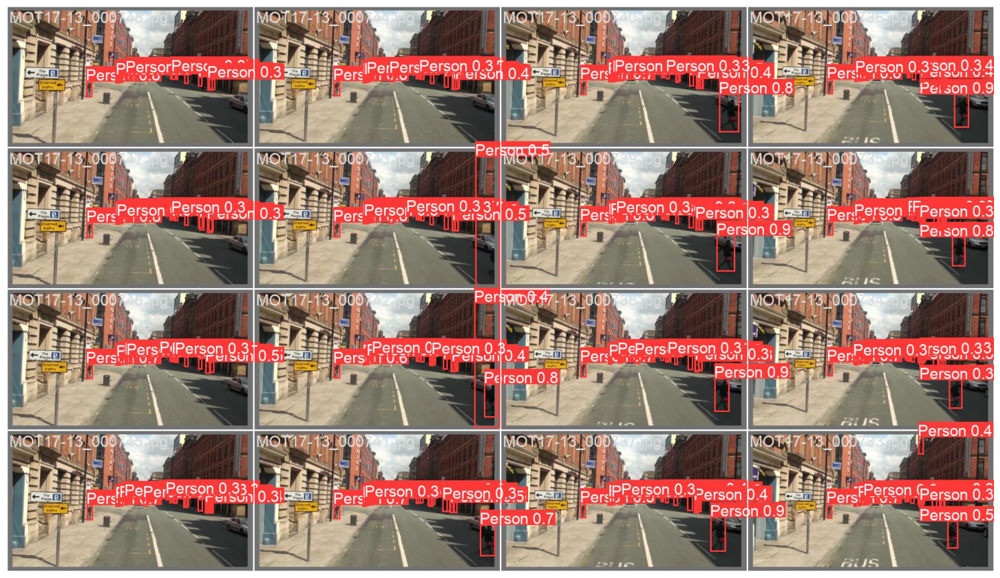

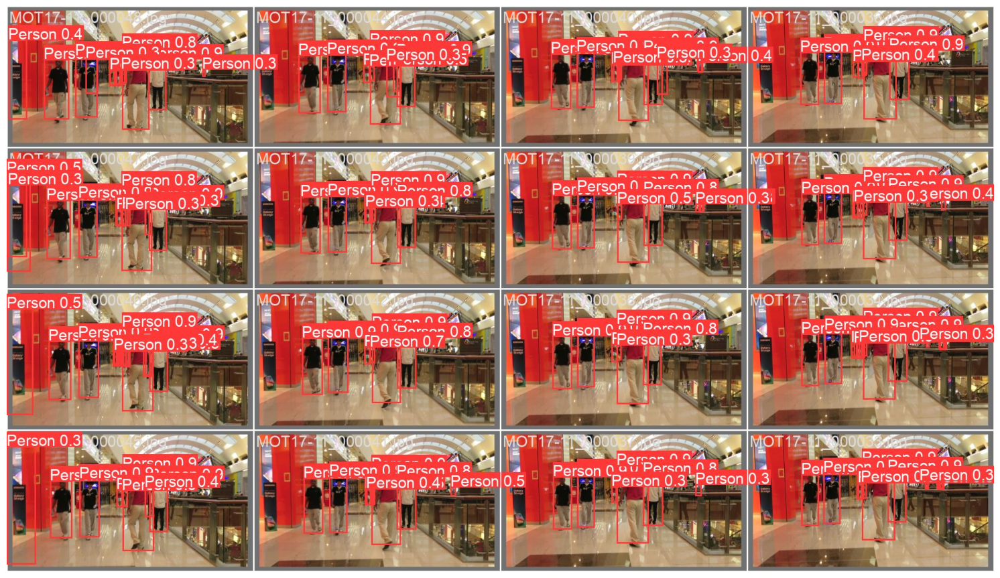

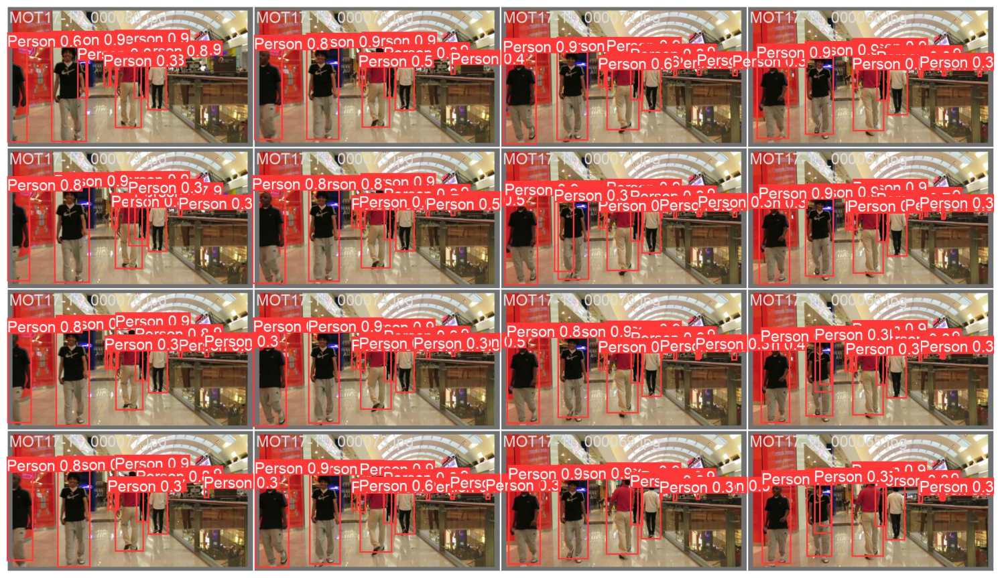

In [23]:
TRAIN = True
show_valid_results(set_res_dir())

### Inference
In this section, we will carry out inference on unseen images and videos from the internet. 

The images for inference are in the `inference_images` directory.

The videos for inference are in the `inference_videos` directory.

In [26]:
import configparser

def convert_mot17_test_to_yolo(source_dir, output_dir):
    image_out_dir = os.path.join(output_dir, "images")
    os.makedirs(image_out_dir, exist_ok=True)

    seen_sequences = set()
    copied_images = 0

    all_seqs = sorted([d for d in os.listdir(source_dir) if 'DPM' in d and os.path.isdir(os.path.join(source_dir, d))])

    print(f"Found {len(all_seqs)} DPM test sequences")

    for seq in all_seqs:
        base_seq = "-".join(seq.split("-")[:2])
        if base_seq in seen_sequences:
            print(f"Skipping duplicate sequence: {seq}")
            continue
        seen_sequences.add(base_seq)

        seq_path = os.path.join(source_dir, seq)
        img_dir = os.path.join(seq_path, 'img1')
        seqinfo_file = os.path.join(seq_path, 'seqinfo.ini')

        if not os.path.exists(seqinfo_file) or not os.path.exists(img_dir):
            print(f"Skipping {seq}: Missing seqinfo or img1")
            continue

        # (Optional) Read resolution from seqinfo.ini
        config = configparser.ConfigParser()
        config.read(seqinfo_file)
        try:
            width = int(config['Sequence']['imWidth'])
            height = int(config['Sequence']['imHeight'])
        except:
            print(f"Warning: Missing resolution info in {seq}")

        all_images = sorted(os.listdir(img_dir))
        for img_name in tqdm(all_images, desc=f"→ {seq}", ncols=80):
            if not img_name.endswith(".jpg"):
                continue
            frame_id = img_name.replace(".jpg", "")
            new_img_name = f"{base_seq}_{frame_id}.jpg"
            src_path = os.path.join(img_dir, img_name)
            dst_path = os.path.join(image_out_dir, new_img_name)
            if not os.path.exists(dst_path):
                shutil.copy(src_path, dst_path)
                copied_images += 1

        print(f"Finished {seq}: {len(all_images)} images copied")

    print("\n Summary:")
    print(f"  → Total images copied: {copied_images}")

In [27]:
convert_mot17_test_to_yolo(source_dir='MOT17/test', output_dir='MOT17_YOLOv5/test')

Found 7 DPM test sequences


→ MOT17-01-DPM: 100%|█████████████████████████| 450/450 [00:12<00:00, 37.20it/s]


Finished MOT17-01-DPM: 450 images copied


→ MOT17-03-DPM: 100%|███████████████████████| 1500/1500 [00:39<00:00, 37.56it/s]


Finished MOT17-03-DPM: 1500 images copied


→ MOT17-06-DPM: 100%|███████████████████████| 1194/1194 [00:22<00:00, 53.12it/s]


Finished MOT17-06-DPM: 1194 images copied


→ MOT17-07-DPM: 100%|█████████████████████████| 500/500 [00:14<00:00, 33.74it/s]


Finished MOT17-07-DPM: 500 images copied


→ MOT17-08-DPM: 100%|█████████████████████████| 625/625 [00:13<00:00, 45.63it/s]


Finished MOT17-08-DPM: 625 images copied


→ MOT17-12-DPM: 100%|█████████████████████████| 900/900 [00:21<00:00, 42.80it/s]


Finished MOT17-12-DPM: 900 images copied


→ MOT17-14-DPM: 100%|█████████████████████████| 750/750 [00:17<00:00, 41.73it/s]

Finished MOT17-14-DPM: 750 images copied

 Summary:
  → Total images copied: 5919


In [ ]:
visualize(inference(set_res_dir(), '../MOT17_YOLOv5/test/images'))

## Training and Inference using  Medium Model

In [4]:
monitor_tensorboard()

In [3]:
%cd yolov5
RES_DIR = set_res_dir()
TRAIN = True
EPOCHS = 10
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5
Current number of result directories: 6
results_7
/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5/utils/general.py:32: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_7, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, 

**Freezing layers of medium Yolov5**

In [4]:
RES_DIR = set_res_dir()
EPOCH = 15
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR} \
    --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

Current number of result directories: 4
results_5
/mnt/c/Users/ADISH GUPTA/Desktop/SOC IITB 25/yolov5/utils/general.py:32: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_5, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], save_period=-1, seed=0, local